# Watershed Study Area

## 1. Caloosahatchee Watershed Boundary Extraction

The Caloosahatchee River watershed boundary was obtained from the USGS Watershed Boundary Dataset (WBD) by querying the hydrologic unit corresponding to HUC-8 03090205. The resulting polygon defines the official extent of the Caloosahatchee basin and serves as the spatial framework for subsequent mapping and analysis.

EPSG:4326


<Axes: >

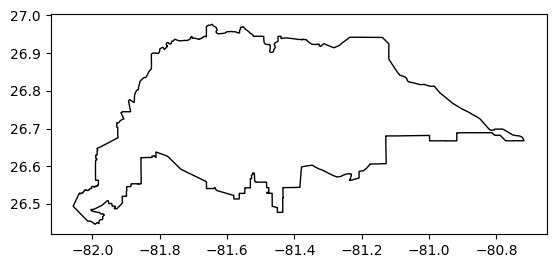

In [1]:
import geopandas as gpd

wbd_url = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703090205%27&outFields=*&f=geojson"
)

caloosa = gpd.read_file(wbd_url)

print(caloosa.crs)   # just to see what it is

caloosa.plot(edgecolor="black", facecolor="none")

## 2. Caloosahatchee River Flowline Extraction

The main stem of the Caloosahatchee River was extracted from the USGS National Hydrography Dataset (NHD) using a name-based query of the NHD Flowline (Large Scale) layer. All polyline features associated with the “Caloosahatchee” GNIS name were retrieved, providing an accurate representation of the river’s course through the watershed.

River CRS: EPSG:4326
Number of features: 268


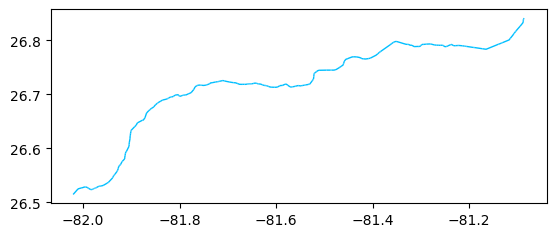

In [3]:
import geopandas as gpd

# NHD Flowline - Large Scale (layer 6), search by name
nhd_url = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/nhd/MapServer/6/"
    "query?where=gnis_name%20LIKE%20%27Caloosahatchee%25%27&outFields=*&f=geojson"
)

river = gpd.read_file(nhd_url)

print("River CRS:", river.crs)
print("Number of features:", len(river))

if len(river) > 0:
    ax = river.plot(color="deepskyblue", linewidth=1)
else:
    print("No features returned – name query didn't find anything.")

In [8]:
pip install contextily

Note: you may need to restart the kernel to use updated packages.


## 3. Monitoring Stations, Coordinate Transformation, and Map Generation (Caloosahatchee)

Monitoring station coordinates were compiled and converted into a geospatial dataset for inclusion on the study-area map. All spatial layers—including the watershed boundary, river flowline, and station locations—were reprojected to the Web Mercator coordinate system (EPSG:3857) to ensure compatibility with the OpenStreetMap basemap. These layers were then combined to generate a composite map of the Caloosahatchee watershed, providing a clear visualization of the basin, the river’s course, and the associated monitoring locations.

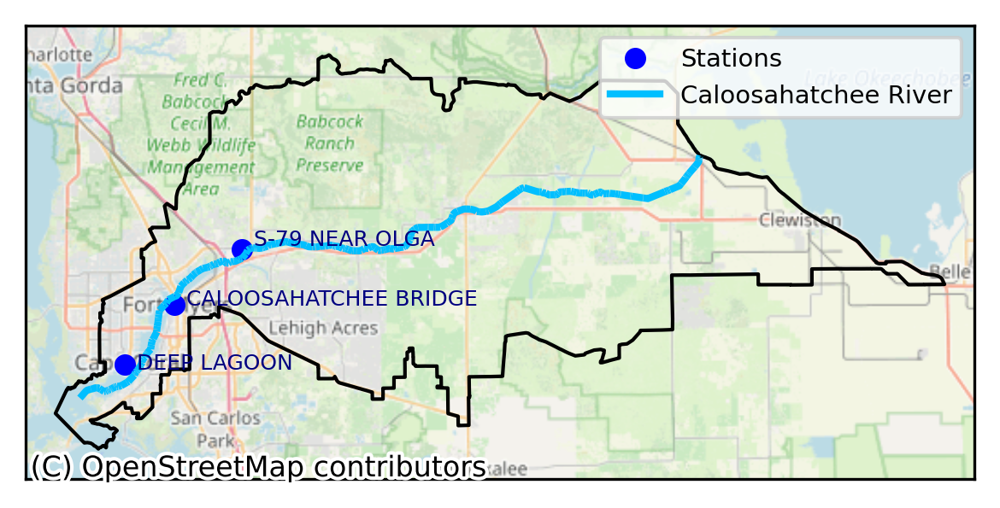

In [14]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as cx
import matplotlib.lines as mlines

# -----------------------------------------------------------
# 1. STATION LOCATIONS (EDIT COORDS AS NEEDED)
# -----------------------------------------------------------
stations_data = [
    {"name": "S-79 NEAR OLGA",        "lon": -81.7760, "lat": 26.7150},
    {"name": "CALOOSAHATCHEE BRIDGE", "lon": -81.8780, "lat": 26.6400},
    {"name": "DEEP LAGOON",           "lon": -81.9530, "lat": 26.5600},
]

stations = gpd.GeoDataFrame(
    stations_data,
    geometry=[Point(d["lon"], d["lat"]) for d in stations_data],
    crs="EPSG:4326"
)

# -----------------------------------------------------------
# 2. PROJECT EVERYTHING TO WEB MERCATOR FOR BASEMAP
# -----------------------------------------------------------
target_crs = "EPSG:3857"

caloosa_3857 = caloosa.to_crs(target_crs)
river_3857   = river.to_crs(target_crs)
stations_3857 = stations.to_crs(target_crs)

# -----------------------------------------------------------
# 3. START FIGURE
# -----------------------------------------------------------
fig, ax = plt.subplots(figsize=(4, 6), dpi=300)

# Watershed outline
caloosa_3857.boundary.plot(ax=ax, color="black", linewidth=1)

# River line
river_3857.plot(ax=ax, color="deepskyblue", linewidth=2)

# Stations
stations_3857.plot(ax=ax, color="blue", markersize=25)

# -----------------------------------------------------------
# 4. PER-STATION LABEL OFFSETS (for cleaner labeling)
# -----------------------------------------------------------
offsets = {
    "S-79 NEAR OLGA":        ( 2000,  700),
    "CALOOSAHATCHEE BRIDGE": ( 2000,    0),
    "DEEP LAGOON":           ( 2000, -800),
}

for x, y, label in zip(
        stations_3857.geometry.x,
        stations_3857.geometry.y,
        stations_3857["name"]):
    
    dx, dy = offsets.get(label, (500, 500))
    
    ax.text(
        x + dx,
        y + dy,
        label,
        fontsize=6,
        color="navy",
    )

# -----------------------------------------------------------
# 5. BASEMAP + EXTENT + LEGEND
# -----------------------------------------------------------
xmin, ymin, xmax, ymax = caloosa_3857.total_bounds
pad = 5000   # meters of padding around bounding box

ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# Add OpenStreetMap basemap
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=target_crs,
    alpha=0.8
)

# Legend handles
station_handle = mlines.Line2D(
    [], [], color="blue", marker="o", linestyle="None",
    markersize=5, label="Stations"
)
river_handle = mlines.Line2D(
    [], [], color="deepskyblue", linewidth=2,
    label="Caloosahatchee River"
)

ax.legend(handles=[station_handle, river_handle],
          loc="upper right", fontsize=7, frameon=True)

# Remove axes ticks
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()

# -----------------------------------------------------------
# 6. SAVE HIGH-RES EXPORT
# -----------------------------------------------------------
plt.savefig("caloosahatchee_watershed_map.png", dpi=600, bbox_inches="tight")
plt.savefig(
    "caloosahatchee_watershed_map.png",
    dpi=600,
    bbox_inches="tight"
)
plt.savefig(
    r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## 4. Peace River Watershed Boundary Extraction

EPSG:4326


<Axes: >

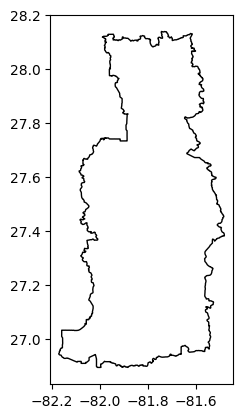

In [15]:
import geopandas as gpd

# Peace River HUC-8 from USGS WBD
wbd_url_peace = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703100101%27&outFields=*&f=geojson"
)

peace_ws = gpd.read_file(wbd_url_peace)

print(peace_ws.crs)
peace_ws.plot(edgecolor="black", facecolor="none")


## 5. Peace River Flowline From NHD

Peace WS CRS: EPSG:4326
Raw flowline features: 274
Clipped flowline features: 195


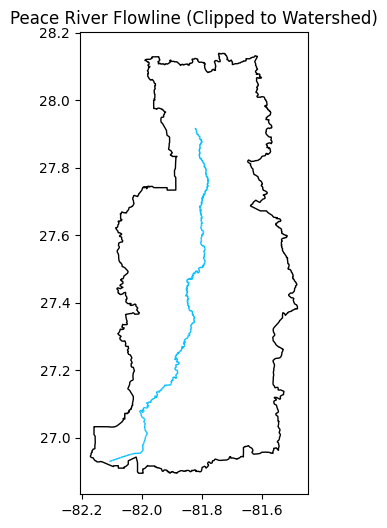

In [17]:
import geopandas as gpd

# ---------------------------------------------------------------------
# 1. Peace River watershed boundary (HUC-8: 03100101)
# ---------------------------------------------------------------------
wbd_url_peace = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703100101%27&outFields=*&f=geojson"
)

peace_ws = gpd.read_file(wbd_url_peace)
print("Peace WS CRS:", peace_ws.crs)

# ---------------------------------------------------------------------
# 2. Peace River flowlines from NHD (often returns extra junk)
# ---------------------------------------------------------------------
nhd_url_peace = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/nhd/MapServer/6/"
    "query?where=gnis_name%20LIKE%20%27Peace%20River%25%27&outFields=*&f=geojson"
)

peace_river = gpd.read_file(nhd_url_peace)
print("Raw flowline features:", len(peace_river))

# ---------------------------------------------------------------------
# 3. Clip flowlines to the watershed to remove stray segments
# ---------------------------------------------------------------------
# Ensure CRS matches
peace_ws = peace_ws.to_crs(peace_river.crs)

peace_river_clip = gpd.overlay(peace_river, peace_ws, how="intersection")
print("Clipped flowline features:", len(peace_river_clip))

# ---------------------------------------------------------------------
# 4. Plot result
# ---------------------------------------------------------------------
ax = peace_ws.plot(edgecolor="black", facecolor="none", figsize=(4, 6))
peace_river_clip.plot(ax=ax, color="deepskyblue", linewidth=1)

plt.title("Peace River Flowline (Clipped to Watershed)")
plt.show()

## 6. Monitoring Stations, Coordinate Transformation, and Map Generation (Peace River)

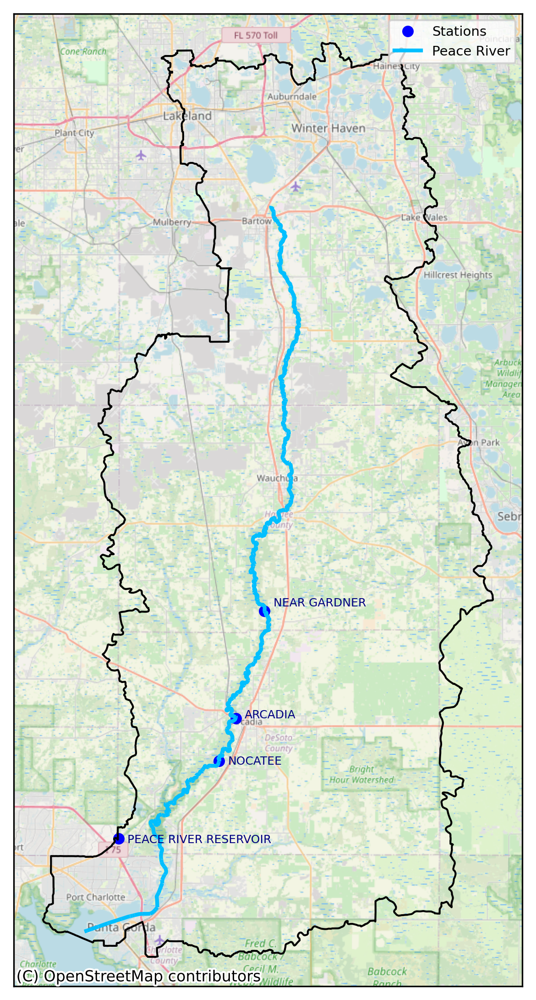

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as cx
import matplotlib.lines as mlines

# -----------------------------------------------------------
# 1. PEACE RIVER STATION LOCATIONS (EDIT COORDS AS NEEDED)
# -----------------------------------------------------------
stations_peace_data = [
    {"name": "NEAR GARDNER",          "lon": -81.8320229, "lat": 27.3669874},
    {"name": "ARCADIA",               "lon": -81.8761946, "lat": 27.22088245},
    {"name": "NOCATEE",               "lon": -81.90175090, "lat": 27.16282928},
    {"name": "PEACE RIVER RESERVOIR", "lon": -82.056225, "lat": 27.056806},
]

stations_peace = gpd.GeoDataFrame(
    stations_peace_data,
    geometry=[Point(d["lon"], d["lat"]) for d in stations_peace_data],
    crs="EPSG:4326"
)

# -----------------------------------------------------------
# 2. REPROJECT EVERYTHING TO WEB MERCATOR FOR BASEMAP
# -----------------------------------------------------------
target_crs = "EPSG:3857"

peace_ws_3857       = peace_ws.to_crs(target_crs)
peace_river_3857    = peace_river_clip.to_crs(target_crs)
stations_peace_3857 = stations_peace.to_crs(target_crs)

# -----------------------------------------------------------
# 3. CREATE FIGURE (TALL LIKE YOUR ADVISOR'S)
# -----------------------------------------------------------
fig, ax = plt.subplots(figsize=(4, 8), dpi=300)

# Watershed outline
peace_ws_3857.boundary.plot(ax=ax, color="black", linewidth=1)

# River line
peace_river_3857.plot(ax=ax, color="deepskyblue", linewidth=2)

# Stations
stations_peace_3857.plot(ax=ax, color="blue", markersize=25)

# -----------------------------------------------------------
# 4. LABELS WITH PER-STATION OFFSETS
# -----------------------------------------------------------
offsets_peace = {
    "NEAR GARDNER":          ( 1500,  800),
    "ARCADIA":               ( 1500,    0),
    "NOCATEE":               ( 1500, -600),
    "PEACE RIVER RESERVOIR": ( 1500, -800),
}

for x, y, label in zip(
        stations_peace_3857.geometry.x,
        stations_peace_3857.geometry.y,
        stations_peace_3857["name"]):

    dx, dy = offsets_peace.get(label, (500, 500))
    ax.text(x + dx, y + dy, label, fontsize=6, color="navy")

# -----------------------------------------------------------
# 5. EXTENT, BASEMAP, LEGEND
# -----------------------------------------------------------
xmin, ymin, xmax, ymax = peace_ws_3857.total_bounds
pad = 5000  # meters of padding
ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# OSM basemap
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=target_crs,
    alpha=0.8
)

# Legend entries
station_handle = mlines.Line2D([], [], color="blue", marker="o",
                               linestyle="None", markersize=5,
                               label="Stations")
river_handle = mlines.Line2D([], [], color="deepskyblue",
                             linewidth=2, label="Peace River")

ax.legend(handles=[station_handle, river_handle],
          loc="upper right", fontsize=7, frameon=True)

ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()

# -----------------------------------------------------------
# 6. SAVE HIGH-RES IMAGE TO YOUR FOLDER
# -----------------------------------------------------------
plt.savefig(
    r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

## 7. Generate Side by Side Graphic of Watersheds

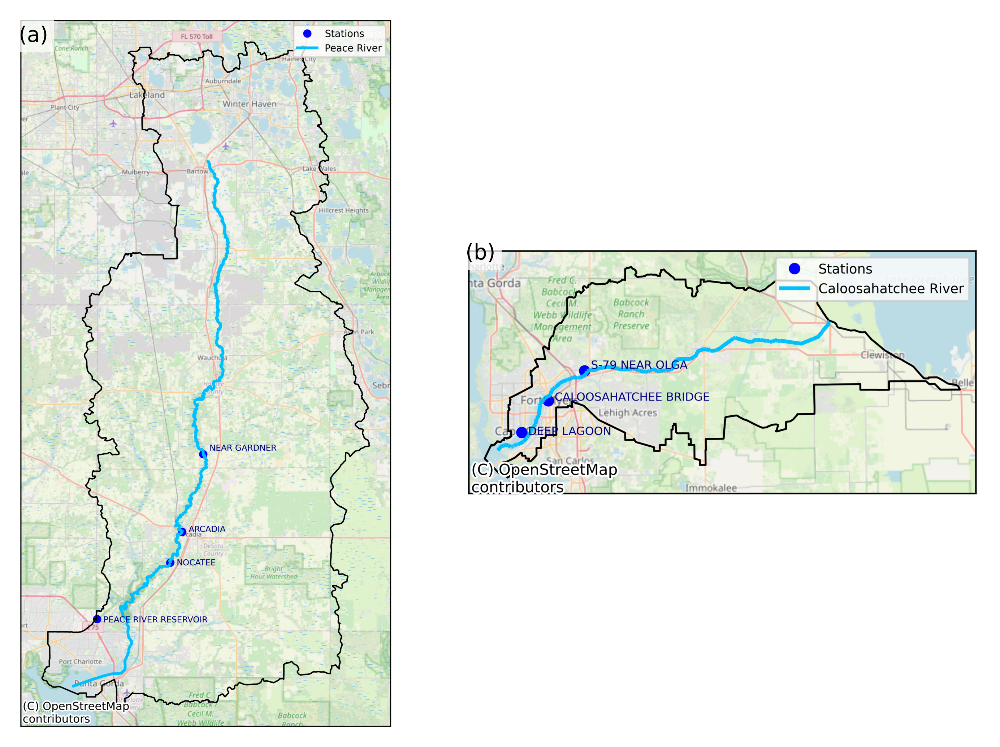

In [30]:
from PIL import Image
import matplotlib.pyplot as plt

# --- EDIT THESE PATHS to your actual saved map files ---
peace_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png"
caloosa_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png"

# Output file
out_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa.png"

# Load images
img_peace = Image.open(peace_png)
img_caloosa = Image.open(caloosa_png)

# Make them the same height (keeps proportions clean)
target_h = max(img_peace.height, img_caloosa.height)

img_peace = img_peace.resize(
    (int(img_peace.width * target_h / img_peace.height), target_h)
)

img_caloosa = img_caloosa.resize(
    (int(img_caloosa.width * target_h / img_caloosa.height), target_h)
)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(10, 7), dpi=300)

axes[0].imshow(img_peace)
axes[0].axis("off")
axes[0].text(
    0.02, 0.98, "(a)",
    transform=axes[0].transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.75)
)

axes[1].imshow(img_caloosa)
axes[1].axis("off")
axes[1].text(
    0.02, 0.98, "(b)",
    transform=axes[1].transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.75)
)

plt.tight_layout()

# Save combined figure
plt.savefig(out_png, dpi=600, bbox_inches="tight")
plt.show()

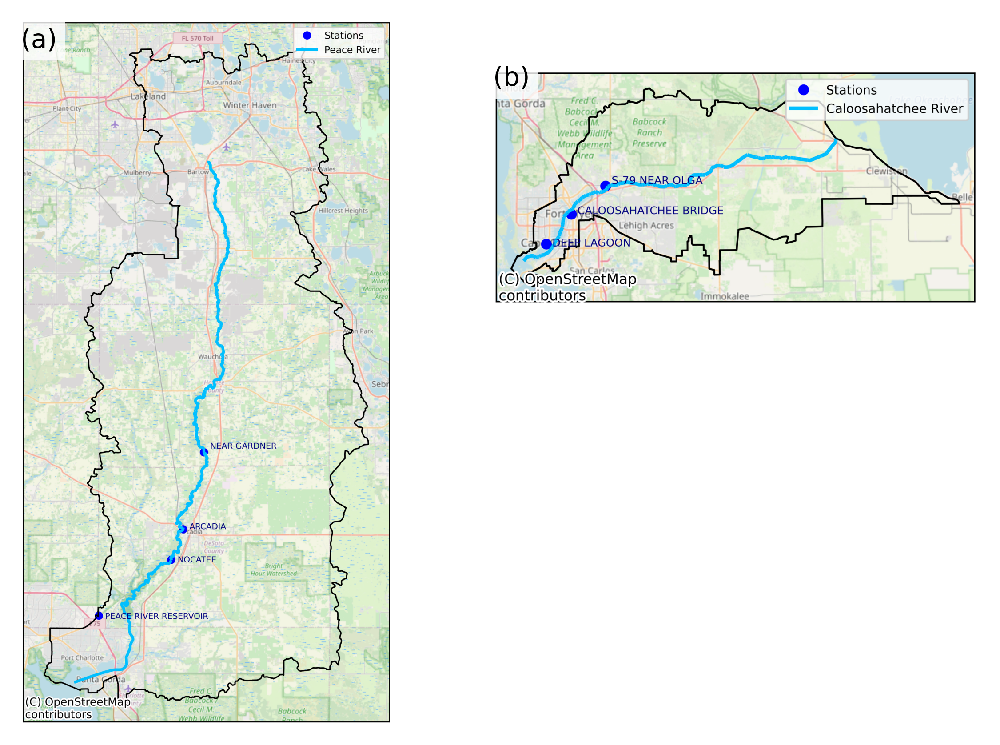

Saved publication figure to:
C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa_PUBLICATION.png


In [27]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# -----------------------------------------------------------
# INPUT FILE PATHS (EDIT IF NEEDED)
# -----------------------------------------------------------
peace_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png"
caloosa_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png"

# OUTPUT FILE
out_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa_PUBLICATION.png"

# -----------------------------------------------------------
# LOAD IMAGES (CONVERT RGBA → RGB TO AVOID PIL ERROR)
# -----------------------------------------------------------
imgA = Image.open(peace_png).convert("RGB")
imgB = Image.open(caloosa_png).convert("RGB")

# OPTIONAL: autocontrast to tighten whites (safe now)
imgA = ImageOps.autocontrast(imgA)
imgB = ImageOps.autocontrast(imgB)

# -----------------------------------------------------------
# RESIZE TO MATCH WIDTHS (MAKES PANELS FEEL BALANCED)
# -----------------------------------------------------------
target_width = 1400  # adjust if desired

imgA = imgA.resize(
    (target_width, int(imgA.height * target_width / imgA.width))
)
imgB = imgB.resize(
    (target_width, int(imgB.height * target_width / imgB.width))
)

# -----------------------------------------------------------
# CREATE GRID LAYOUT (PUBLICATION STYLE)
# -----------------------------------------------------------
fig = plt.figure(figsize=(10, 7), dpi=300)

gs = gridspec.GridSpec(
    2, 2,
    width_ratios=[1.0, 1.0],
    height_ratios=[1.0, 1.0],
    wspace=0.05,
    hspace=0.05
)

# (a) Peace River — left column, full height
axA = fig.add_subplot(gs[:, 0])
axA.imshow(imgA)
axA.axis("off")
axA.text(
    0.02, 0.98, "(a)",
    transform=axA.transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.8)
)

# (b) Caloosahatchee — upper right
axB = fig.add_subplot(gs[0, 1])
axB.imshow(imgB)
axB.axis("off")
axB.text(
    0.02, 0.98, "(b)",
    transform=axB.transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.8)
)

# Bottom-right intentionally blank (clean composition)
ax_blank = fig.add_subplot(gs[1, 1])
ax_blank.axis("off")

# -----------------------------------------------------------
# SAVE HIGH-RES FIGURE
# -----------------------------------------------------------
plt.savefig(out_png, dpi=600, bbox_inches="tight")
plt.show()

print("Saved publication figure to:")
print(out_png)